In [0]:
!pip install mlflow > /dev/null

**check  `mlflow` binary is available**

In [3]:
!which mlflow

/usr/local/bin/mlflow


In [0]:
from sklearn.datasets import make_moons
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
import mlflow
import mlflow.sklearn
%matplotlib inline


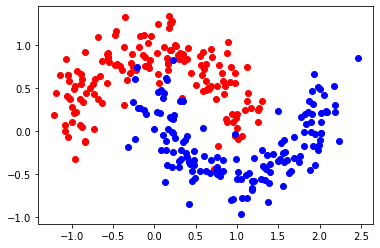

In [8]:
X,y = make_moons(300,noise=0.2)
plt.scatter(X[:,0][y==0], X[:,1][y==0], color='red', label="class 0")
plt.scatter(X[:,0][y==1], X[:,1][y==1], color='blue', label="class 1")

## Create an experiment

In [92]:
experiment_name = "my_experiment X"
try:
  mlflow.create_experiment(experiment_name)
  print ("experiment created")
except mlflow.exceptions.MlflowException as e:
  if "already exists" in str(e):
    print ("reusing existing experiment")
  else:
    raise e

reusing existing experiment


In [39]:
experiment = mlflow.get_experiment_by_name(experiment_name)
print (experiment)

<Experiment: artifact_location='file:///content/mlruns/1', experiment_id='1', lifecycle_stage='active', name='my_experiment X', tags={}>


## Instrumentalize runs

In [0]:
from sklearn.model_selection import train_test_split


Xtr, Xts, ytr, yts = train_test_split(X, y, train_size=0.7)

for gamma in [0.1,1,10]:
  with mlflow.start_run(experiment_id=experiment.experiment_id):
    estimator = SVC(gamma=gamma)
    mlflow.log_param("gamma", gamma)
    estimator.fit(Xtr, ytr)
    mlflow.log_metric("train accuracy", estimator.score(Xtr,ytr))
    mlflow.log_metric("test accuracy", estimator.score(Xts,yts))
    mlflow.sklearn.log_model(estimator, "model")    

    with open("estimator.txt", 'w') as f:
      f.write(str(estimator))
    mlflow.log_artifact('estimator.txt', 'model')
    pd.DataFrame(np.vstack([Xtr.T, ytr, estimator.predict(Xtr)]).T, columns=["x0", "x1", "y_true", "y_pred"]).to_csv("preds.csv", index=False)
    mlflow.log_artifact('preds.csv', 'data')


## Visualize results

In [0]:
from tensorboard import notebook

In [83]:
%%bash --bg
pkill mlflow
pkill gunicorn
mlflow ui 

Starting job # 8 in a separate thread.


In [85]:
notebook.display(port=5000, height=800)

<IPython.core.display.Javascript object>